<a href="https://colab.research.google.com/github/michalszczecinski/data-driven-notebooks/blob/master/dev/templates/knowledge_notebook_minimal_template.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stress and Strain


1. This notebook is about concepts of `Stress and strain in strength of materials`.

2. The purpose of this notebook is to introduce a basic concepts related to stress and strain. We aim to improve understanding and retention of those concepts by providing intuitive analogy and relating stress and strain to a common use of those terms in daily life.

3. It is important because `Stress and strain of materials` is a concept that we can observe everywhere in real world. It is a very important concept in engineering design, as it allows us to design materials and structures that are safe and reliable. It allows us to understand and predict the behaviour of materials. 

In [2]:
# imports
import pandas as pd
import math
import unittest

# for unit conversion
import pint

## Stress-strain definitions

Using slides from youtube playlist by Infinity MFG (link in references). My notes below the slides.

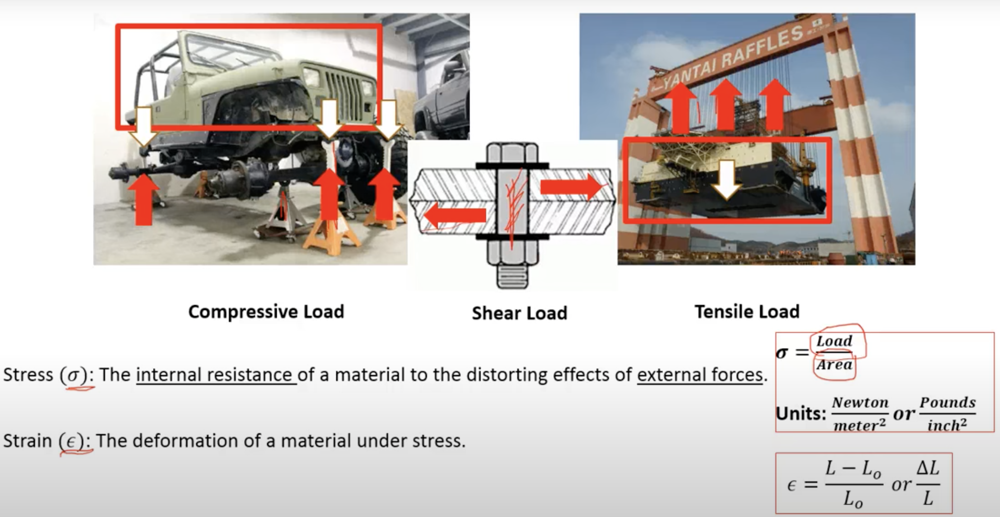

* Fomula for stress is
$$ \text{stress} = \frac{\text{Load}}{\text{Area}} $$
* We can observe that stress formula is the total load (in N) acting on a an area (in meters squared). This is force per unit area, so we can think about this as force normalised by area.
* The larger the force, the larger the stress. The larger the area, the smaller the stress.
* We can define this as the `internal resistance of a material to deformation by external forces`. That sounds like more **positive definition refering to resiliance of materials**.
* I am mentioning this because in daily life we often refer to stress as a negative thing. We say that we are under stress, or that we are stressed out. This is because we are under pressure, and we are not able to cope with it. This is a negative thing. But in engineering we are talking about stress as a positive thing. We are talking about the ability of a material to resist deformation. This is a desired property.
* To come up with analogy relating to daily life we can substitute load with `workload` and area with `capacity` (resources * time). So if we face higher workload (more forces coming from many tasks) - the stress is higher. If we have a higher capacity, like having more resources to help (people, tools, better methods/workflows), we can handle more workload, so then with the fixed workload the stress should be lower.
* So based on this analogy the formula for a definition of stress in daily life would be something like

$$ \text{stress (life analogy)} = \frac{\text{WorkLoad}}{\text{Capacity}} $$



## Stress-strain relation

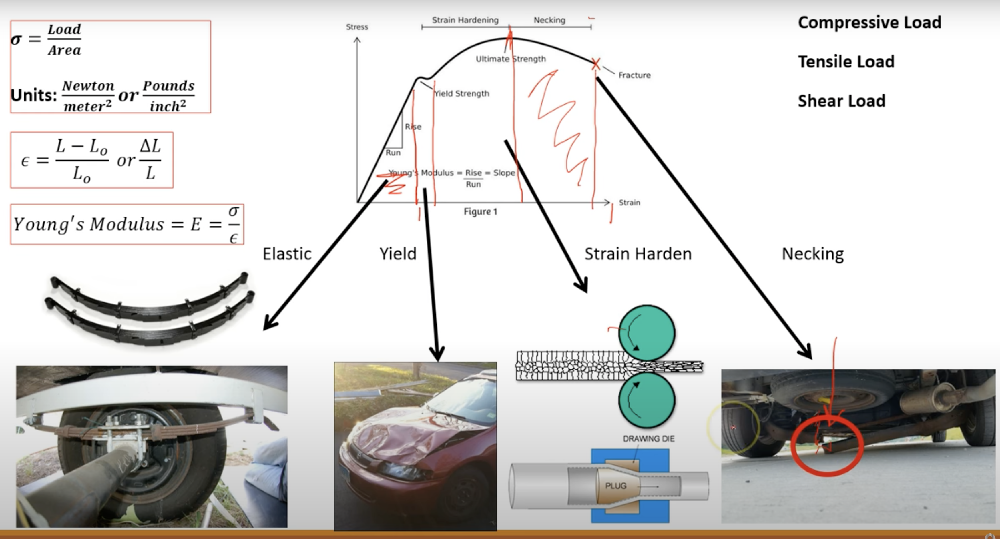

* `stress-strain relationship` is very important, particularly looking at the different `stages like elastic, yield, strain harden and necking points` on the curve.
* when designing machines and structures engineers work in the `elastic range`, since it is the most predictable, reliable and easy to model (there is `aproximately linear relationship` between stress and strain, with a `slope of Young's modulus`).
* `Elastic range` is really important because that is the range within which if body is deformed it will return to its original shape when the load is removed (it will 'recover'). This is important because it means that we can design structures that are safe and reliable. If we design a structure that is not elastic, it will not return to its original shape, and it will be unsafe and unreliable (`plasticity`).
* We can think about this in terms of daily life, if we are in the right range of stress we can easily recover without permament effect. 
* There is also strain hardening range just before the material reaches `the ultimate strength`, that is an area where material gets stronger by changing its `molecular structure` (crystals). It is used in practice to harden some materials like knife blades.
*  Going back to **daily life analogy**, there might be benefit of **pushing oneself** under that limit of breaking in order to improve ability to handle stress and make yourself **more resiliant**.
* Caveat: the stress-strain curve is not strictly linear, it is a curve. It is a curve that is very close to linear in the elastic range, but it is not linear. This is important to note, because it means that we should be careful with using linear regression to model the stress-strain curve. We need to use non-linear regression.

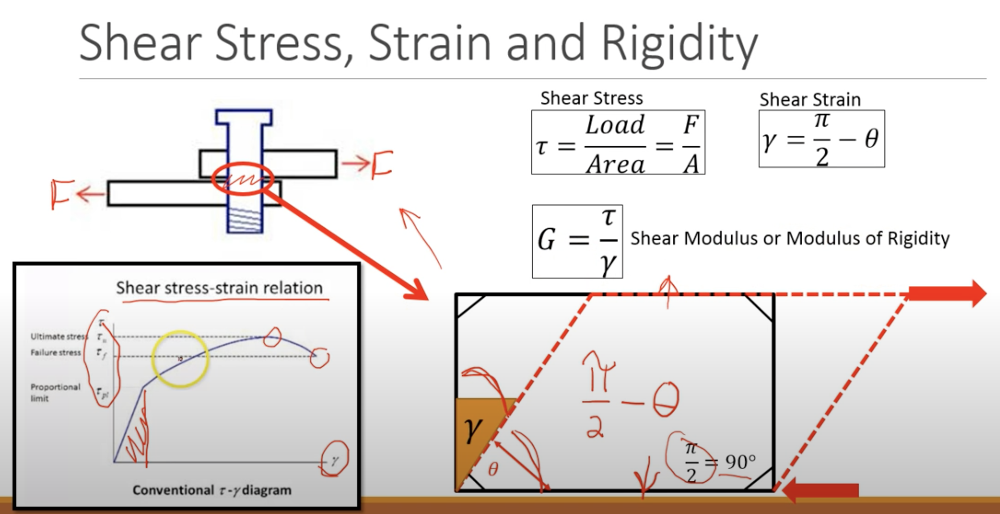

Relation of quantities and deriving final displacement formula.

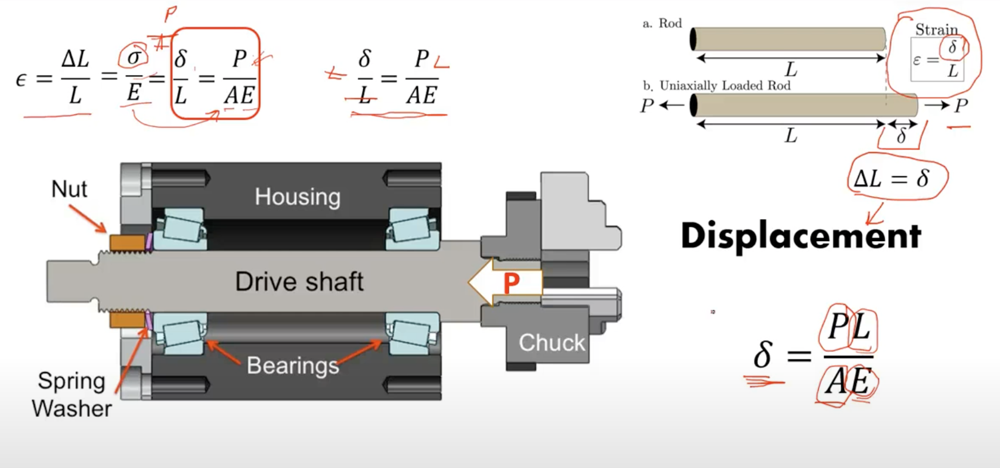

### Modulus of elasticity

* linear relationship between stress and strain in the elastic range
* ` Modulus of Elasticity (E) = stress / strain`

$$E = \frac{\sigma}{\epsilon}$$

* It describes how much stress we need to put on the object for it to change the length.
* `Strain   =   change in length (delta) / original length (L_0)`
$$\epsilon = \frac{\Delta L}{L}$$


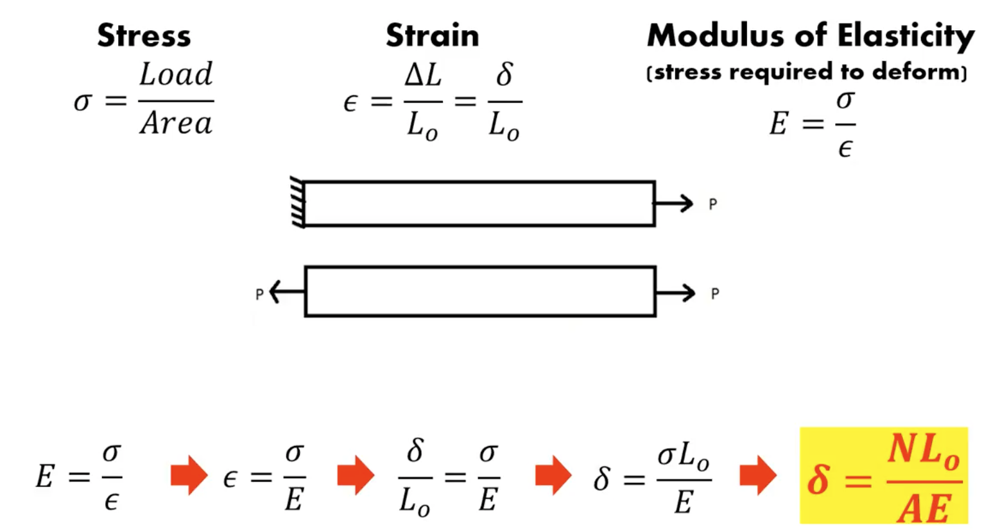

## Problem
Example for calculating stress, using strain and the stress-strain relationship (hookes law).

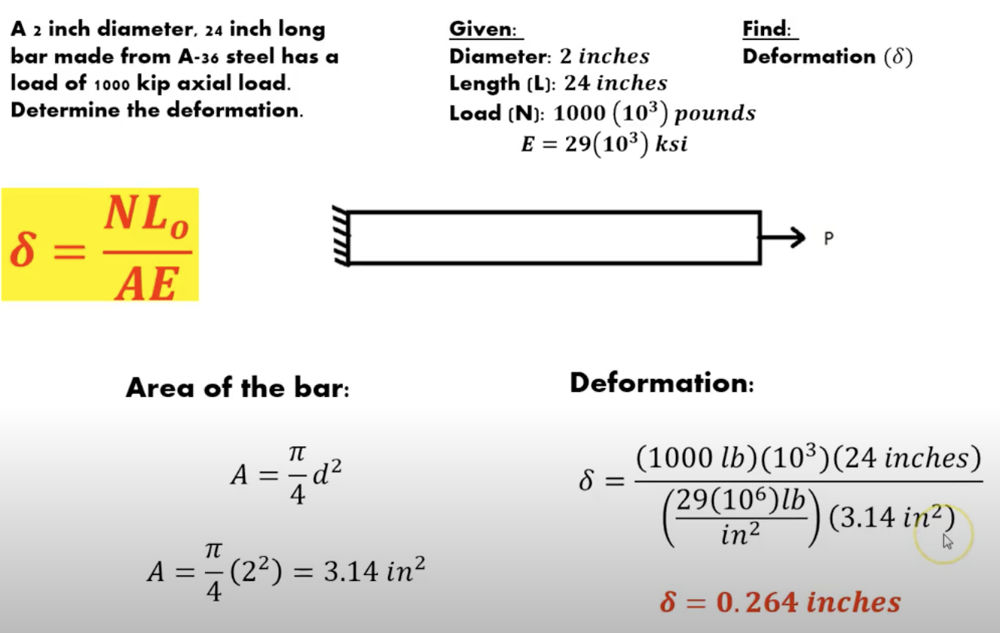

### Set up

In [4]:
# test of converting units, meter to inches
ureg = pint.UnitRegistry()
my_size = 1 * ureg.meter
print(my_size)  # 1 meter
print(my_size.to(ureg.inch))  # 39.37007874015748 inch

1 meter
39.37007874015748 inch


In [5]:
# test of converting units, inches to meters
ureg = pint.UnitRegistry()
my_size = 1 * ureg.inch
print(my_size)  # 1 inch
print(my_size.to(ureg.meter))  # 0.025 meter ~ 2.5 cm

1 inch
0.0254 meter


### Given

In [35]:
D = 2 * ureg.inch
L = 24 * ureg.inch
#load 
N = 1000 * 10**3 * ureg.lbf # pounds, notice multiplying by 10**3,
# it is a bit confusing in the text because it was not clear if by `1000 (10**3)`,
# author meant 1000 = 10**3 or 1000*(10**3), assuming second case
E = 29 * 10**3  * ureg.ksi # 29000 ksi
print(E)
print(E.to(ureg.MPa)) #~ 200 MPa

29000 kip_per_square_inch
199947.96150188256 megapascal


## Method

$$\delta = \frac{N * Lo}{A * E}$$

## Solution

In [29]:
# Calculate
A = math.pi * (D/2)**2
print(A) # inches squared
print(A.to(ureg.meter**2)) #meters squared

3.141592653589793 inch ** 2
0.0020268299163899908 meter ** 2


In [31]:
delta_L = (N * L) / (A * E)
delta_L

print(delta_L.to(ureg.inch)) # inches
print(delta_L.to(ureg.centimeter)) # centimeters

0.2634288713245165 inch
0.669109333164272 centimeter


## References

[1] [Infinity MFG Strength of Materials Youtube Playlist](https://www.youtube.com/watch?v=W5cviLowZ1U&list=PLAXJqmuqGEr7QjsVVyl5jFY6HQTqw6Bfq&index=1)